#  **DATA MINING PROJECT** <!-- font: metronova -->

**Data is regarding a fictional insurance company in Portugal.**

|      Variable     |               Description              |                                                 Additional Information                                                |
|:-----------------:|:--------------------------------------:|:---------------------------------------------------------------------------------------------------------------------:|
|         ID        |                   ID                   |                                                          ---                                                          |
|     First_Year    |    Year of the Customer first policy   |                                     May be considered the first year as a customer                                    |
|      Birthday     |         Customers birthday year        |                                        The current year of the database is 2016                                       |
|     Education     |             Academic Degree            |                                                                                                                       |
|   Monthly_Salary  |        Gross monthly salary (€)        |                                                                                                                       |
|        Area       |               Living area              |                          No further information provided about the meaning of the area codes                          |
|      Children     |          Binary variable (y=1)         |                                                                                                                       |
|        CMV        |        Customer Monetary Value         |  Lifetime value = (annual profit from the customer) X (number of years that they are a customer) - (acquisition cost) |
|    Claims_Rate    |               Claims Rate              |                    Amount paid by the insurance company (€)/ Premiums (€) Note: in the last 2 years                   |
|       Motor       |       Premiums (€) in LOB: Motor       | Annual Premiums (2016) Negative Premiums may manifest reversals occurred in the current year, paid in previous one(s) |
|     Household     |     Premiums (€) in LOB: Household     |                                                                                                                       |
|       Health      |       Premiums (€) in LOB: Health      |                                                                                                                       |
|        Life       |        Premiums (€) in LOB: Life       |                                                                                                                       |
| Work_Compensation | Premiums (€) in LOB: Work Compensation |                                                                                                                       |

As a Data Mining/Analytic Consultant, you are asked develop a Customer Segmentation in such a way that it will be possible for the Marketing Department to better understand all the **different Customers’ Profiles.**


You are expected to define, describe and explain the **clusters you chose**. Invest time in reasoning how you want to do your clustering, possible approaches, and advantages or disadvantages of different decisions. Simultaneous, you should express the marketing approach you recommend for each cluster. 

## IMPORTING PACKAGES WE NEED

We will need **sqlite3** to import the database and work on it using SQL.

We will need **pandas** to use data structures and data analysis tools.

We will need **seaborn** to create graphics.

We will need **matplotlib.pyplot** to create data visualizations.

In [34]:
import sqlite3
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px

## IMPORTING THE DATABASE

First we need to create an object that contains the **path** where the database is stored.

After that we need to declare a connection between sqlite and the database. This gives us a **conection object** (conn).

Then, we need to create the **cursor**. Connections with SQL in Python need a connection object and a query. The cursor allows us to manage both.

We didn't have access to the database schema, so we needed to figure the **name of the tables**. We found out that the database had two tables - **Engage** and **LOB**.

Finally, since we also were not sure about the **names of the variables** in each of these tables, we printed the list of columns for each.

Lastly, we joined both of the tables using **Customer Identity**. In this step we also renamed variables according to the table above.

In [35]:
my_path = r'C:\Users\Sofia\OneDrive - NOVAIMS\Nova IMS\Mestrado\Cadeiras\Data mining\Project\DataMiningMaster\insurance.db'
conn = sqlite3.connect(my_path)
cursor = conn.cursor()

cursor.execute("SELECT name FROM sqlite_master WHERE type='table';")
print(cursor.fetchall())

[('LOB',), ('Engage',)]


In [36]:
LOB=""" select * from LOB; """
df_lob = pd.read_sql_query(LOB,conn)

Engage=""" select * from Engage; """
df_engage = pd.read_sql_query(Engage,conn)

print(list(df_lob.columns.values))
print(list(df_engage.columns.values))

insurance= """
select L.[Customer Identity] as Cust_ID, [First Policy´s Year] as First_Year, [Brithday Year] as Birthday, [Educational Degree] as Education,
[Gross Monthly Salary] as Monthly_Salary, [Geographic Living Area] as Area, [Has Children (Y=1)] as Children, [Customer Monetary Value] as CMV, [Claims Rate] as Claims_Rate,
[Premiums in LOB: Motor] as Motor, [Premiums in LOB: Household] as Household, [Premiums in LOB: Health] as Health, [Premiums in LOB:  Life] as Life, 
[Premiums in LOB: Work Compensations] as Work_Compensation
from LOB L, Engage E 
where L.[Customer Identity]=E.[Customer Identity]
"""

df_insurance = pd.read_sql_query(insurance,conn)

['index', 'Customer Identity', 'Premiums in LOB: Motor', 'Premiums in LOB: Household', 'Premiums in LOB: Health', 'Premiums in LOB:  Life', 'Premiums in LOB: Work Compensations']
['index', 'Customer Identity', 'First Policy´s Year', 'Brithday Year', 'Educational Degree', 'Gross Monthly Salary', 'Geographic Living Area', 'Has Children (Y=1)', 'Customer Monetary Value', 'Claims Rate']


## CLEANING DATA

The first thing we did was checking the **number of observations** we had in the imported data frame. We found out that we had **10296** observations.

Then, we checked and removed **duplicate observations** without having in consideration the Customer ID. We found out that we had 3 duplicate observations. This means we now have **10293** observations. We stored the duplicates in a data frame called **duplicated**.

We decided to take a look at the **descriptive statistics** and created a new column for the descriptive statistics table called Nulls that basically tells us how many None values do we have for each variable.

With the new variable created we found out that there was only one None value for the Area variable. Since there is nothing we can replace it for, we decided to drop this observation, leaving us with **10292** observations.

We also assumed that Null values for the premium variables meant that the customer did not spend any money on that insurance category. Having this in consideration, we decided to replace the Null values in these variables with 0, using the **fillna()** function.

In [37]:
df_insurance.shape[0]

duplicated = df_insurance[df_insurance.duplicated(subset = df_insurance.columns[1:])]
df_insurance.drop_duplicates(subset = df_insurance.columns[1:], inplace = True)
df_insurance.shape[0]

descriptive = df_insurance.describe().T
descriptive['Nulls'] = df_insurance.shape[0] - descriptive['count']

df_insurance.dropna(subset = ['Area'], inplace = True)
df_insurance.shape[0]

df_insurance['Motor'].fillna(0, inplace = True)
df_insurance['Health'].fillna(0, inplace = True)
df_insurance['Life'].fillna(0, inplace = True)
df_insurance['Work_Compensation'].fillna(0, inplace = True)

## VERIFICAÇÃO E TRATAMENTO DE OUTLIERS

We started by evaluating which variables could have outliers based on the descriptive statistics table. The criteria we used were:
    * Is the standard deviation really big?
    * Is the maximum or minimum value much different from the average?
According to these criteria, the variables that we should pay attention to when it comes to outliers were **Monthly_Salary**, **CMV**, **Claims_Rate** and all the **Premiums**.

We started by taking a look at the **boxplot** for **Monthly_Salary**. Here we found out that we only had two outliers so we decided to immediatly remove them as it would not make us loose a lot of information. At this point we have **10254** observations.

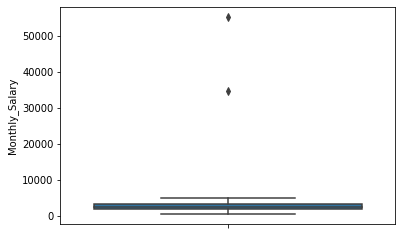

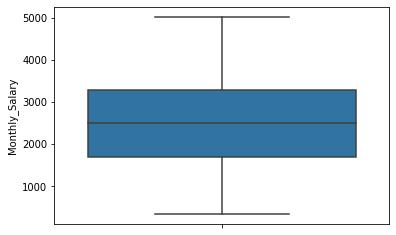

In [38]:
sns.boxplot(y="Monthly_Salary", data=df_insurance)
plt.show()
fig = px.histogram(df_insurance, x=df_insurance.Monthly_Salary, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

df_insurance=df_insurance[df_insurance.Monthly_Salary<30000]
sns.boxplot(y="Monthly_Salary", data=df_insurance)
plt.show()
fig = px.histogram(df_insurance, x=df_insurance.Monthly_Salary, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

Then, we studied the **CMV**. Here we found a dramatic outlier. We decided to remove it immediatly so that we could have a better visualization of the rest of the data.

In [39]:
fig = px.histogram(df_insurance, x=df_insurance.CMV, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.CMV, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [40]:
df_insurance=df_insurance[(df_insurance.CMV>-125000) | (df_insurance.CMV.isnull())] #1 row dropped
df_insurance=df_insurance[(df_insurance.CMV>-20000) | (df_insurance.CMV.isnull())] #5 rows dropped
df_insurance=df_insurance[(df_insurance.CMV>-11000) | (df_insurance.CMV.isnull())] #1 row dropped
df_insurance=df_insurance[(df_insurance.CMV>-5000) | (df_insurance.CMV.isnull())] #5 rows dropped
df_insurance=df_insurance[(df_insurance.CMV>-1000) | (df_insurance.CMV.isnull())] #2 rows dropped
df_insurance=df_insurance[(df_insurance.CMV>-420) | (df_insurance.CMV.isnull())] #1 row dropped

fig = px.histogram(df_insurance, x=df_insurance.CMV, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.CMV, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [41]:
df_insurance=df_insurance[(df_insurance.CMV<1500) | (df_insurance.CMV.isnull())] #12 rows dropped

fig = px.histogram(df_insurance, x=df_insurance.CMV, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.CMV, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [42]:
df_insurance=df_insurance[(df_insurance.CMV<1320) | (df_insurance.CMV.isnull())] #? rows dropped

fig = px.histogram(df_insurance, x=df_insurance.CMV, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.CMV, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

We also studied the **Claims_Rate**. For a start it looked like there were 3 dramatic outliers, so we decided to remove them. Lately, when we did the new boxplot we decided to remove some more outliers.

In [46]:
fig = px.histogram(df_insurance, x=df_insurance.Claims_Rate, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Claims_Rate, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

df_insurance=df_insurance[(df_insurance.Claims_Rate<=3) | (df_insurance.Claims_Rate.isnull())]

After that, we studied the **Motor Premiums**. We found 6 outliers and removed them.

In [47]:
fig = px.histogram(df_insurance, x=df_insurance.Motor, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Motor, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [48]:
df_insurance=df_insurance[(df_insurance.Motor<=2000) | (df_insurance.Motor.isnull())] #3 rows dropped
fig = px.histogram(df_insurance, x=df_insurance.Motor, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Motor, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

Next, we studied the **Health Premiums**. We also removed some outliers at that exact moment.

In [49]:
fig = px.histogram(df_insurance, x=df_insurance.Health, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Health, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [51]:
df_insurance=df_insurance[(df_insurance.Health<=6000) | (df_insurance.Health.isnull())] #1 row dropped
fig = px.histogram(df_insurance, x=df_insurance.Health, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Health, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [52]:
df_insurance=df_insurance[(df_insurance.Health<=420) | (df_insurance.Health.isnull())] #1 row dropped
fig = px.histogram(df_insurance, x=df_insurance.Health, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Health, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

When it comes to the **Life Premiums**, we decided not to do anything since the outliers were all mixed up.

In [54]:
fig = px.histogram(df_insurance, x=df_insurance.Life, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Life, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [56]:
df_insurance=df_insurance[(df_insurance.Life<=331) | (df_insurance.Life.isnull())]
fig = px.histogram(df_insurance, x=df_insurance.Life, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Life, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [57]:
df_insurance=df_insurance[(df_insurance.Life<=285) | (df_insurance.Life.isnull())]
fig = px.histogram(df_insurance, x=df_insurance.Life, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Life, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

The **Household Premiums** had a really dramatic outlier, so we also removed it.

In [58]:
fig = px.histogram(df_insurance, x=df_insurance.Household, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Household, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [59]:
df_insurance=df_insurance[(df_insurance.Household<=1700) | (df_insurance.Household.isnull())] 
fig = px.histogram(df_insurance, x=df_insurance.Household, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Household, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [60]:
df_insurance=df_insurance[(df_insurance.Household<=1240) | (df_insurance.Household.isnull())] 
fig = px.histogram(df_insurance, x=df_insurance.Household, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Household, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

The **Work Compensations Premium** also had a huge outlier. We removed it.

In [61]:
fig = px.histogram(df_insurance, x=df_insurance.Work_Compensation, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Work_Compensation, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [62]:
df_insurance=df_insurance[(df_insurance.Work_Compensation<=400) | (df_insurance.Work_Compensation.isnull())]
fig = px.histogram(df_insurance, x=df_insurance.Work_Compensation, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Work_Compensation, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

In [63]:
df_insurance=df_insurance[(df_insurance.Work_Compensation<=300) | (df_insurance.Work_Compensation.isnull())]
fig = px.histogram(df_insurance, x=df_insurance.Work_Compensation, color_discrete_sequence=['darkseagreen'], template='plotly_white')
fig.show()

fig = px.box(df_insurance, y=df_insurance.Work_Compensation, color_discrete_sequence=['dimgrey'], template='plotly_white')
fig.show()

After removing the outliers mentioned above, we ended up having **10237** observations.

## COHERENCE CHECKS

We needed to confirm if the data we had made any sense. We created a set of rules to evaluate it. We created new variables for each of the rules - in these variables the value 1 means that the observation in not obbeing to the rule.

The first rule we created was about the **Birthday**. We decided that the year could not be bigger than 2016 or smaller than 1896 (a person is probably not older than 120).

The second rule we created was about the **First_Year**. The constraints are the same. It does not make sense for the First_Year to be smaller than any Birthday so it should not be smaller than 1896 too. Also, we can not have record of something that did not happen yet, so it can't be bigger than 2016.

The third rule is also about the **First_Year**. Since this variable represents the first contact of the client with the insurance firm, it does not make sense that this contact happened before the person was born. This is why we decided that the First_Year can not be smaller than the Birthday.

The fourth rule created refers to both **Birthday** and **Monthly_Salary**. Since the minimum legal age for working in Portugal is 16, we settled that someone under this age can not have a salary.

The fifth rule is about both **Birthday** and **Education**. It does not make a lot of sense that someone with 16 years old or less has a Bachelor Degree.

Finally, the last rule is about **Monthly_Salary** and **Premiums**. A person can not spend more money than they earn.

In [27]:
df_insurance['Coherence_Birthday']=df_insurance.Birthday.apply(lambda x: 1 if (x>2016 or x<1896) else 0)

df_insurance['Coherence_First1']=df_insurance.First_Year.apply(lambda x: 1 if (x>2016 or x<1896) else 0)

df_insurance['Coherence_First2']=df_insurance.apply(lambda x: 1 if x.First_Year<x.Birthday else 0, axis=1)

df_insurance['Coherence_Salary']=df_insurance.apply(lambda x:1 if (2016-x.Birthday<16 and x.Monthly_Salary>0) else 0, axis=1)

df_insurance['Coherence_Education']=df_insurance.apply(lambda x:1 if (2016-x.Birthday<=16 and x.Education=='3 - BSc/MSc') else 0, axis=1)

def summ(num1, *args):
    total=num1
    for num in args:
        total=total+num
    return total

df_insurance['Coherence_Premiums']=df_insurance.apply(lambda x:1 if (summ(x.Motor, x.Household, x.Life, x.Health, x.Work_Compensation)>(x.Monthly_Salary*12)) else 0, axis=1)